In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import math

# from unet import UNetModel
from attr_classifier import FaceAttrModel
# from diffusion import GaussianDiffusion

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

# To get diffusion model from huggingface
from diffusers import UNet2DModel, DDIMScheduler, DDPMScheduler

import PIL.Image

import pandas as pd

# Force VSCode to load the CUBLAS_WORKSPACE_CONFIG env variable for deterministic results
from dotenv import load_dotenv
load_dotenv()

/root/anaconda3/envs/expanded_diff_lin/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
seed = 0

# load all models
unet = UNet2DModel.from_pretrained("google/ddpm-ema-celebahq-256")
# scheduler = DDIMScheduler.from_config("google/ddpm-ema-celebahq-256")
# scheduler.set_timesteps(num_inference_steps=500)
scheduler = DDPMScheduler(num_train_timesteps=1000)

# set to cuda
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

unet.to(torch_device)
unet.config

/root/anaconda3/envs/expanded_diff_lin/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('dropout', 0.0),
            ('act_fn', 'si

In [3]:
face_attributes = ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 
                   'Bangs', 'Big_Lips', 'Big_Nose','Black_Hair', 'Blond_Hair',
                   'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 
                   'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 
                   'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 
                   'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 
                   'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 
                   'Wearing_Hat','Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young' 
]

# Load face attribute model (classifier)
attr_model = FaceAttrModel(pretrained=False, selected_attrs=face_attributes).to(torch_device)
attr_model.load_state_dict(torch.load('models/Resnet18.pth', map_location='cuda:0'))
print('Loaded attributes model')

Loaded attributes model


/root/anaconda3/envs/expanded_diff_lin/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/root/anaconda3/envs/expanded_diff_lin/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [4]:
# Specify target attribute values
target_attributes = {
    '5_o_Clock_Shadow': 0,
    'Arched_Eyebrows': 0,
    'Attractive': 0,
    'Bags_Under_Eyes': 0,
    'Bald': 1,
    'Bangs': 1,
    'Big_Lips': 0,
    'Big_Nose': 0,
    'Black_Hair': 1,
    'Blond_Hair': 1,
    'Blurry': 0,
    'Brown_Hair': 1,
    'Bushy_Eyebrows': 0,
    'Chubby': 0,
    'Double_Chin': 0,
    'Eyeglasses': 1,
    'Goatee': 1,
    'Gray_Hair': 0,
    'Heavy_Makeup': 0,
    'High_Cheekbones': 0,
    'Male': 1,
    'Mouth_Slightly_Open': 0,
    'Mustache': 1,
    'Narrow_Eyes': 0,
    'No_Beard': -1,
    'Oval_Face': 0,
    'Pale_Skin': 0,
    'Pointy_Nose': 0,
    'Receding_Hairline': 0,
    'Rosy_Cheeks': 1,
    'Sideburns': 0,
    'Smiling': 0,
    'Straight_Hair': 0,
    'Wavy_Hair': 1,
    'Wearing_Earrings': 0,
    'Wearing_Hat': 0,
    'Wearing_Lipstick': 0,
    'Wearing_Necklace': 0,
    'Wearing_Necktie': 0,
    'Young': 0, # 0 corresponds to young, 1 corresponds to old
}

# Mask controls which variables will be taken into account for guidance
mask = {key: 0 for key in target_attributes.keys()}
mask['Male'] = 1
mask['Brown_Hair'] = 1
mask['Smiling'] = 1
mask['Young'] = 1

# Convert to tensors
target_attributes = torch.tensor([target_attributes[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(torch_device)
mask = torch.tensor([mask[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(torch_device)

In [5]:
# For reproducibility
torch.use_deterministic_algorithms(True)

# torch.use_deterministic_algorithms threw an error until I set this:
# !conda env config vars set CUBLAS_WORKSPACE_CONFIG=:4096:8
# https://conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html#setting-environment-variables
# You may have to reactivate the environment for the change to take effect. In my case restarting the kernel wasn't enough, but it worked after I exited and reopened vscode.

# Unconditional Generation 
WARNING: if using torch.use_deterministic_algorithms from above, make sure you set CUBLAS_WORKSPACE_CONFIG as commented in the above cell!!

0it [00:00, ?it/s]

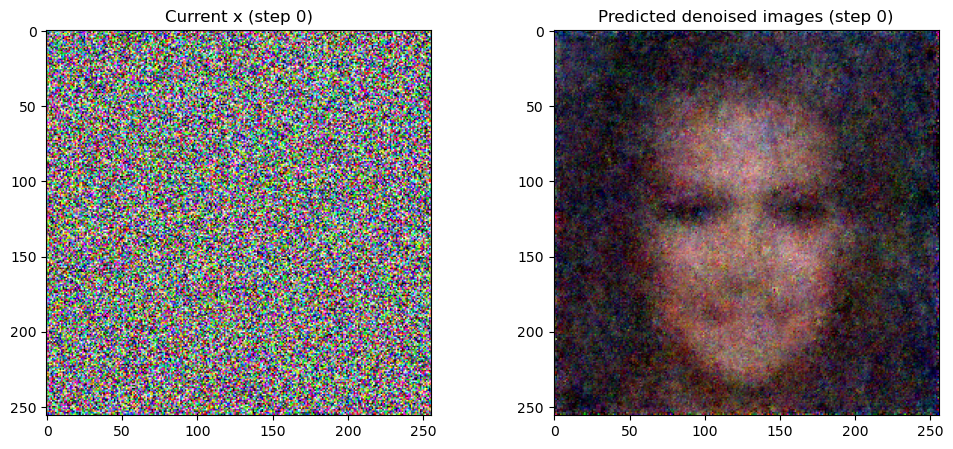

249it [00:26, 10.52it/s]

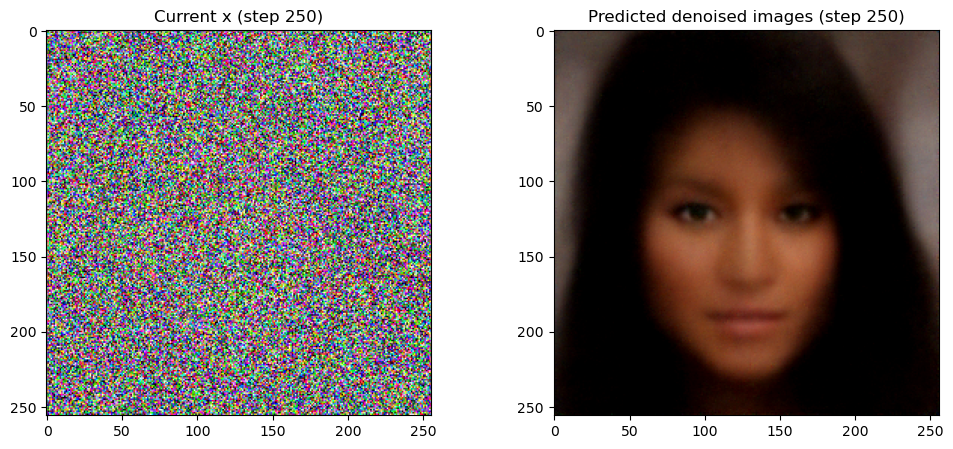

500it [00:57,  8.27it/s]

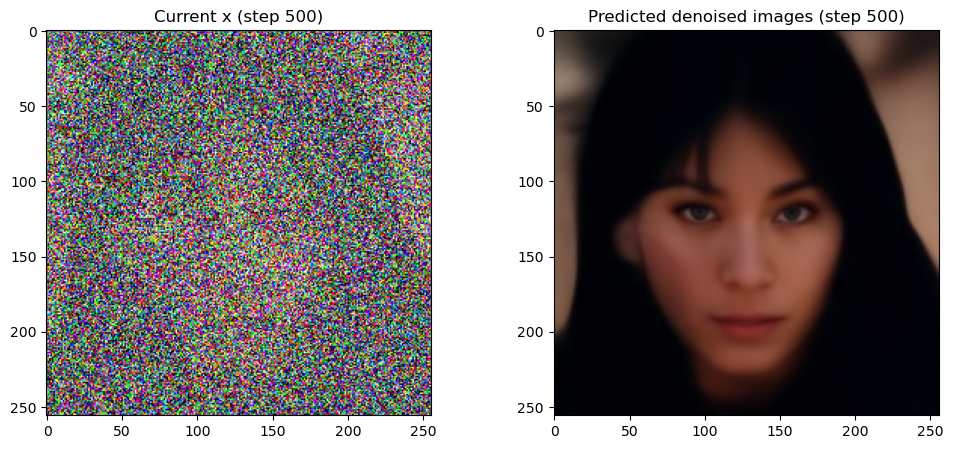

750it [01:30,  7.37it/s]

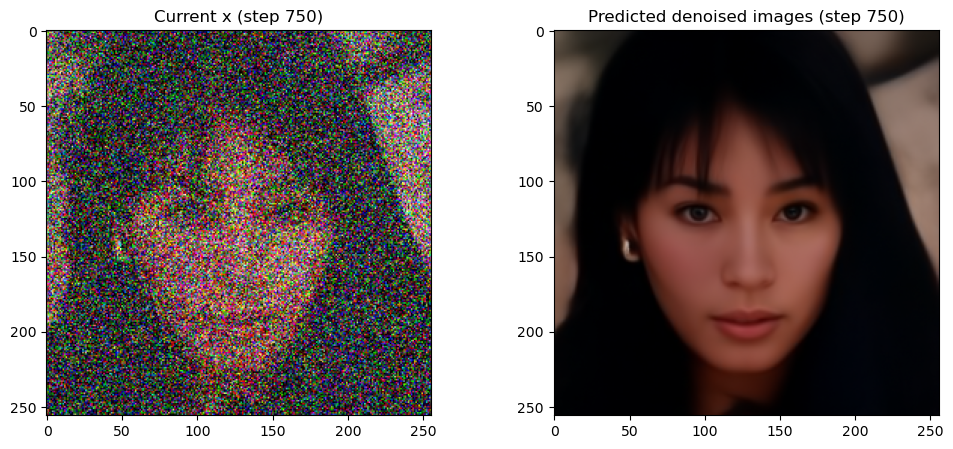

999it [02:00,  8.54it/s]

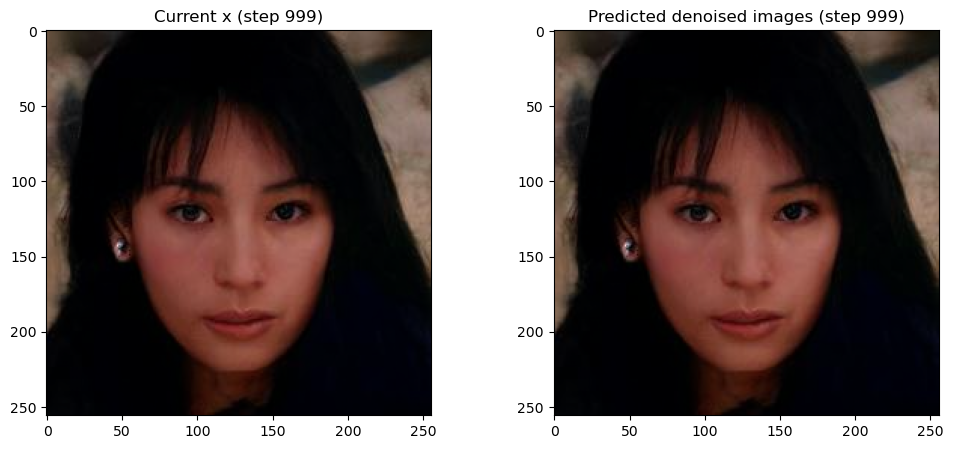

1000it [02:00,  8.28it/s]


In [14]:
# No guidance
torch.manual_seed(seed) # For deterministic results
x = torch.randn(1, 3, unet.sample_size, unet.sample_size).to(torch_device)

for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # Predict amount of noise in diffusion model
    noise_pred = unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

# Figure 13 Functional Equivalent 
## Guided towards attributes {man, brown hair, young, not smiling}

0it [00:00, ?it/s]

0 loss: 0.4351993501186371


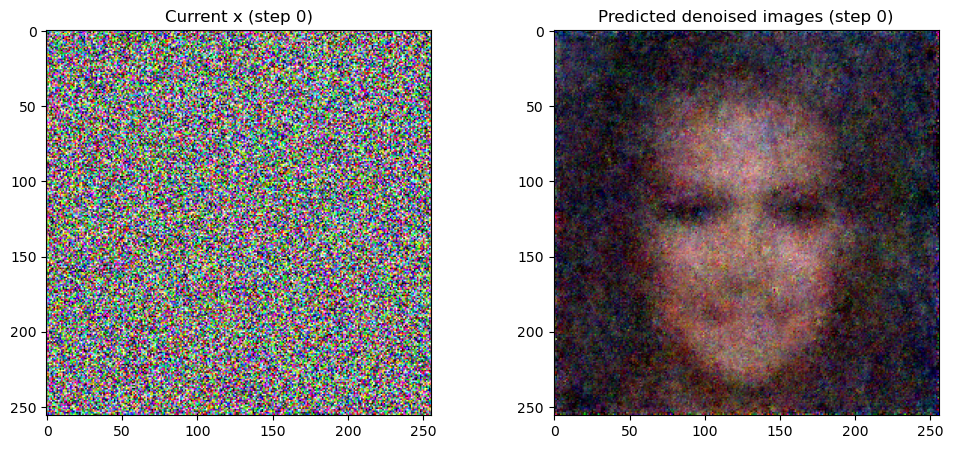

102it [00:17,  6.65it/s]

100 loss: 0.3460717797279358


202it [00:32,  6.79it/s]

200 loss: 0.29669004678726196


250it [00:39,  6.83it/s]

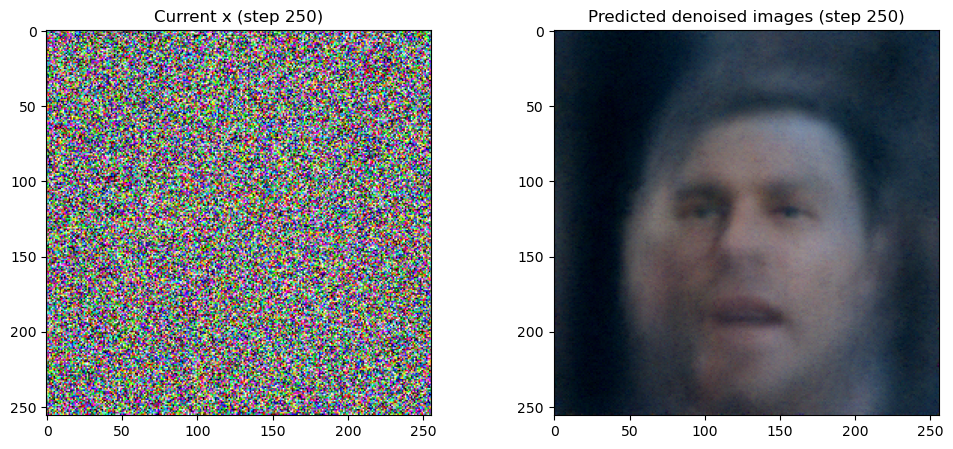

302it [00:49,  6.80it/s]

300 loss: 0.5568278431892395


402it [01:04,  6.70it/s]

400 loss: 0.3415214717388153


500it [01:19,  6.73it/s]

500 loss: 0.46477100253105164


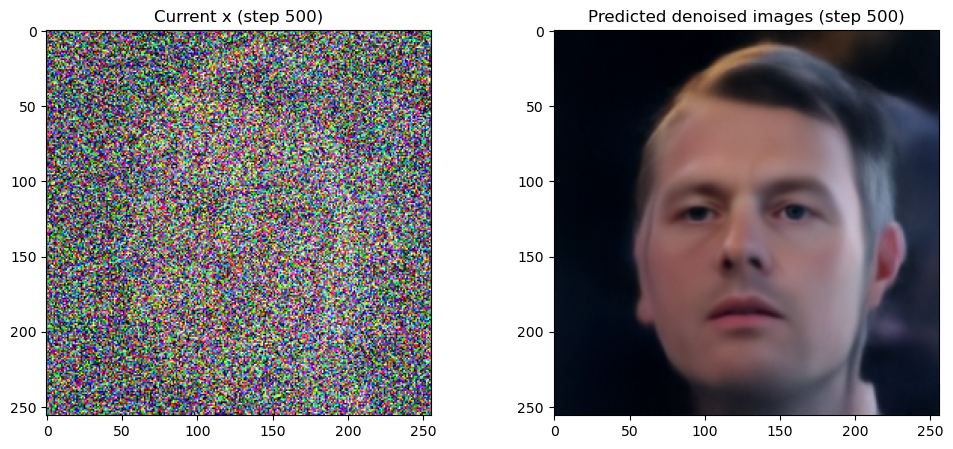

602it [01:36,  6.70it/s]

600 loss: 0.3177955150604248


702it [01:51,  6.88it/s]

700 loss: 0.4200519621372223


750it [01:58,  6.56it/s]

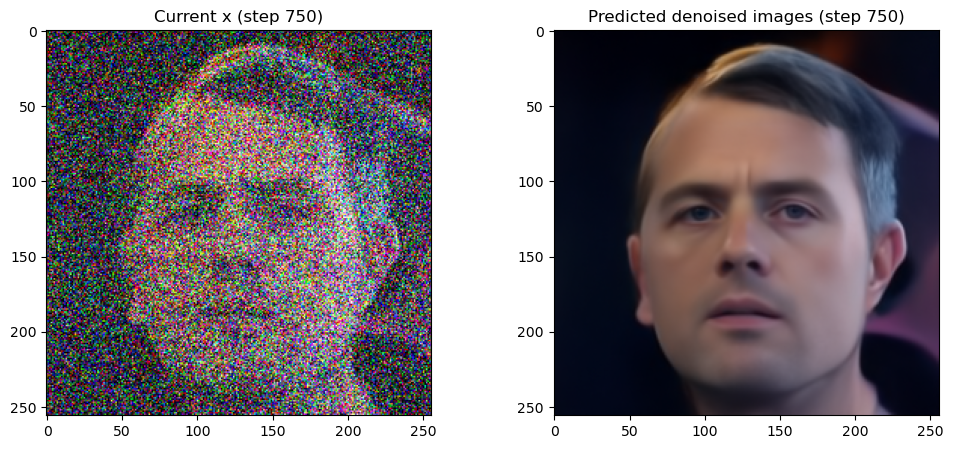

802it [02:08,  6.67it/s]

800 loss: 0.2372615784406662


902it [02:23,  6.79it/s]

900 loss: 0.2011088877916336


999it [02:37,  6.80it/s]

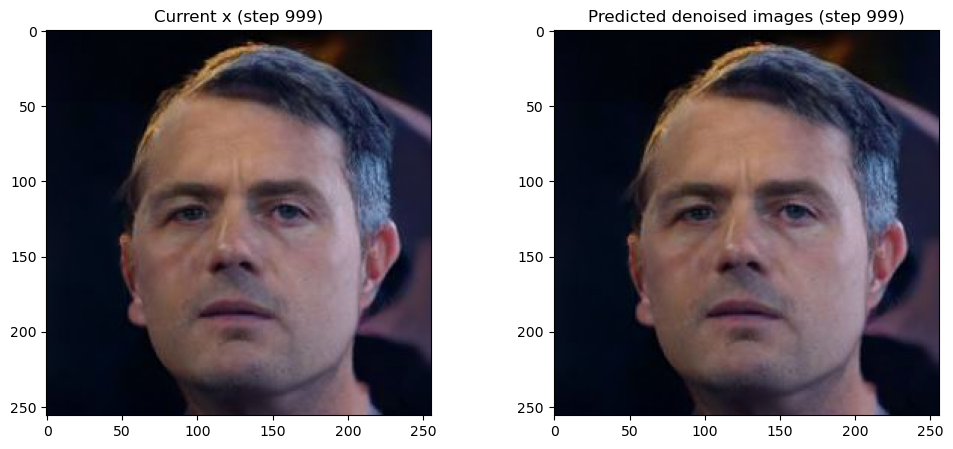

1000it [02:38,  6.32it/s]


Text(0.5, 1.0, 'Classification Loss')

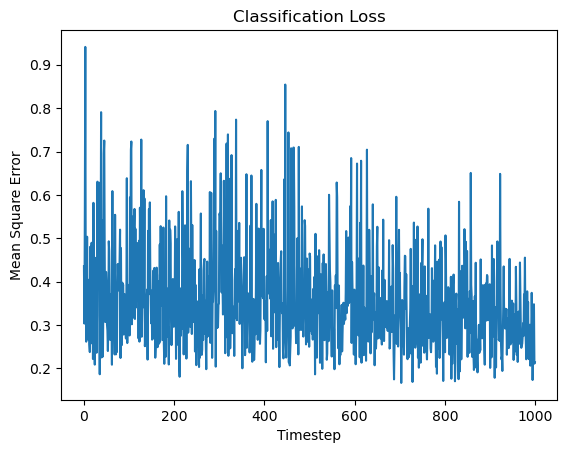

In [6]:
# brown hair, male, young, not smiling

# Variant 2: setting x.requires_grad before calculating the model predictions
guidance_loss_scale = 1
torch.manual_seed(seed)
x = torch.randn(1, 3, unet.sample_size, unet.sample_size).to(torch_device)

loss_graph = []
for i, t in tqdm(enumerate(scheduler.timesteps)):

    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # predict (with grad this time)
    noise_pred = unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate loss
    target_attr = target_attributes * mask
    x_attr = attr_model(x0) * mask
    loss = F.mse_loss(x_attr, target_attr)
    loss_graph.append(loss.item())
    if i % 100 == 0:
        print(i, "loss:", loss.item())

    # Get gradient
    cond_grad = -torch.autograd.grad(loss, x)[0]

    # # Modify x based on this gradient
    # alpha_bar = 1 - scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + (cond_grad * alpha_bar.sqrt())
    # )  # Note the additional scaling factor here!

    # Modify x based on this gradient
    x = x.detach() + cond_grad

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()

plt.plot(loss_graph)
plt.xlabel("Timestep")
plt.ylabel("Mean Square Error")
plt.title("Classification Loss")

# Adaptive Feature Weights (guided towards same attributes as above)
## Figure 14 Functional Equivalent

0it [00:00, ?it/s]

0 loss: 0.4351993501186371
0 (weighted) loss: 7.8260040283203125


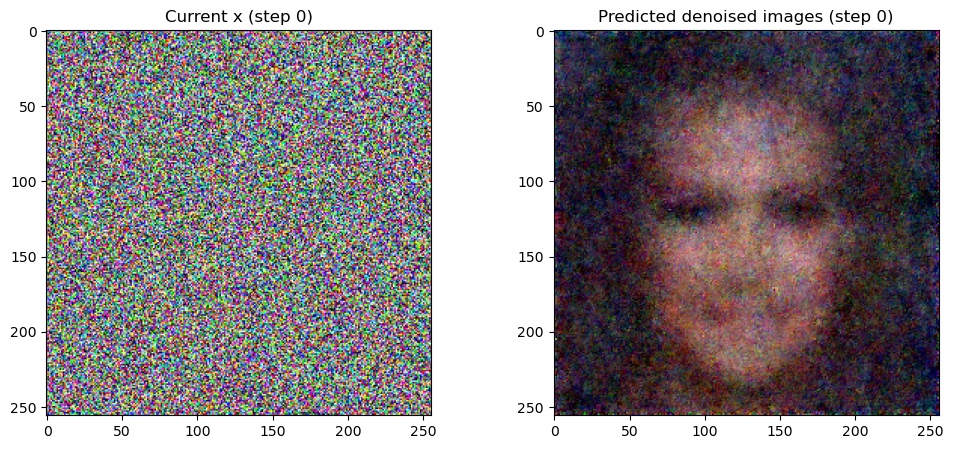

101it [02:35,  1.87s/it]

100 loss: 0.22600455582141876
100 (weighted) loss: 3.547184705734253


201it [05:24,  1.72s/it]

200 loss: 0.24965010583400726
200 (weighted) loss: 3.426556348800659


250it [06:47,  1.02s/it]

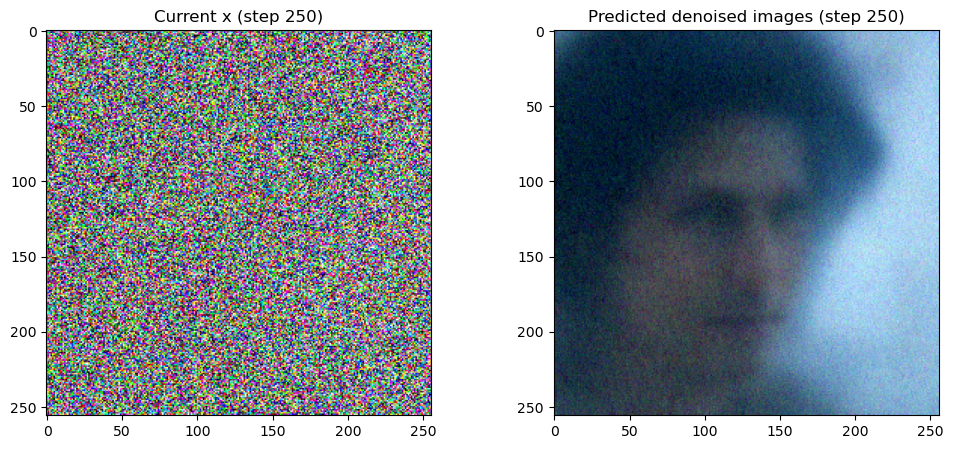

301it [08:18,  2.23s/it]

300 loss: 0.2634405195713043
300 (weighted) loss: 3.110508918762207


401it [10:34,  1.19it/s]

400 loss: 0.22342906892299652
400 (weighted) loss: 1.5767360925674438


500it [12:59,  2.23s/it]

500 loss: 0.33569368720054626
500 (weighted) loss: 1.3831976652145386


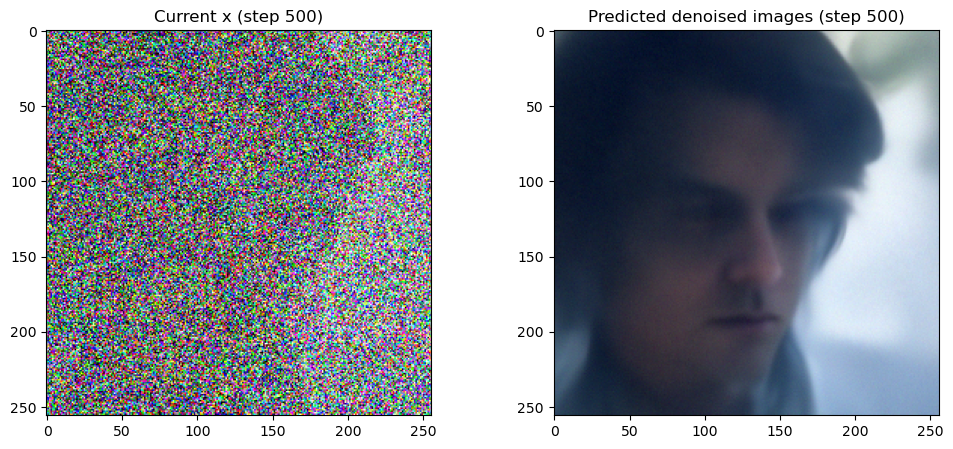

601it [15:41,  1.81it/s]

600 loss: 0.27790507674217224
600 (weighted) loss: 0.7281433939933777


701it [18:45,  1.39s/it]

700 loss: 0.386625200510025
700 (weighted) loss: 0.5113810896873474


750it [20:13,  1.43s/it]

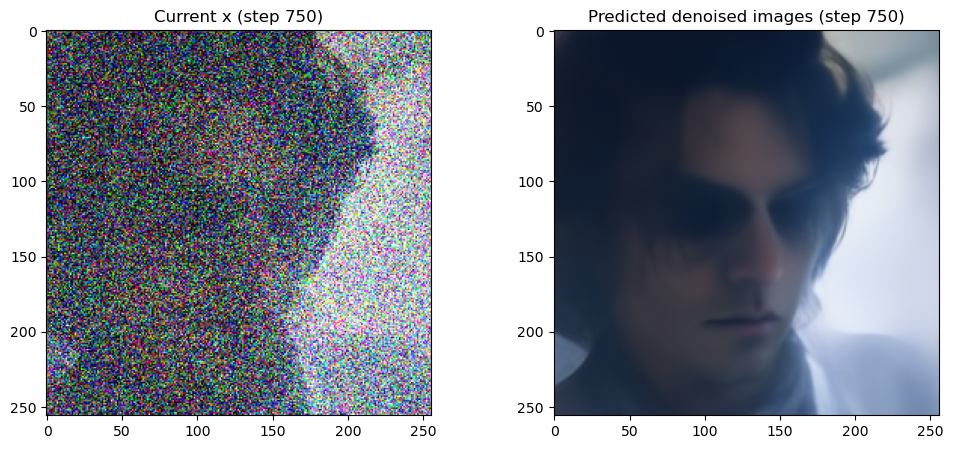

801it [21:29,  1.75s/it]

800 loss: 0.22777727246284485
800 (weighted) loss: 0.13039202988147736


901it [24:25,  1.29s/it]

900 loss: 0.19896695017814636
900 (weighted) loss: 0.04796525463461876


999it [27:02,  1.11it/s]

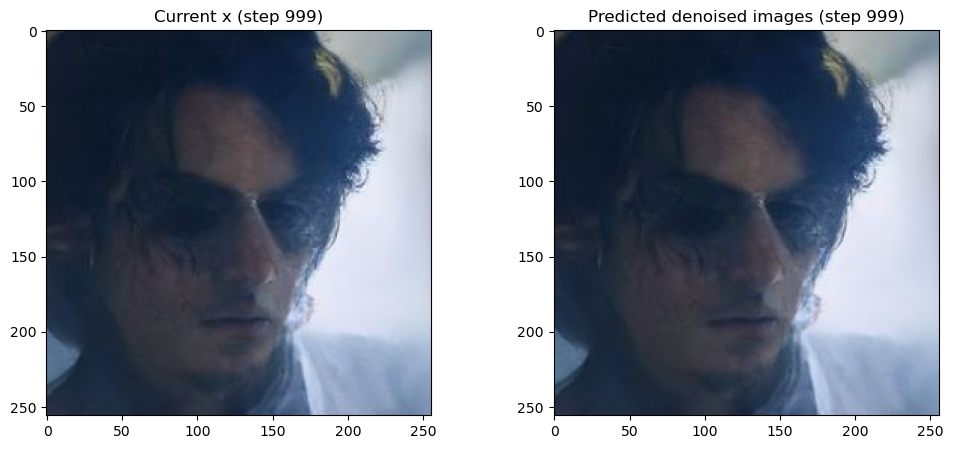

1000it [27:04,  1.62s/it]


In [7]:
torch.manual_seed(seed)
target_attr = target_attributes * mask
x = torch.randn(1, 3, unet.sample_size, unet.sample_size).to(torch_device)
feature_weights_graph = []
feature_weights_graph.append(mask.detach().requires_grad_())
feature_weights = feature_weights_graph[0]
feature_guidance_scale = 10 # weight the feature guidance magnitude

loss_graph = []
loss_graph_weightless = []
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # Set requires_grad before the model forward pass
    x = x.detach().requires_grad_()
    model_input = scheduler.scale_model_input(x, t)

    # Predict amount of noise in diffusion model
    noise_pred = unet(model_input, t)["sample"]

    # Get the predicted x0:
    x0 = scheduler.step(noise_pred, t, x).pred_original_sample

    # Calculate loss
    x_attr = attr_model(x0) * mask
    # but mse is scalar, change to vector of attr and multiply

    # Modify the feature weights

    feature_weights = mask.detach().requires_grad_() # reset feature_weights to 1 so we don't snowball a feature
    loss = torch.abs(F.mse_loss(x_attr, target_attr, reduction='none') * feature_weights)
    loss_graph_weightless.append(loss.detach().cpu().numpy())
    loss = torch.mean(loss)
    if i % 100 == 0:
        print(i, "loss:", loss.item())

    # Get gradient for feature weights
    cond_grad_2 = -torch.autograd.grad(loss, feature_weights)[0]
    
    # Modify feature weights based on this gradient and normalize
    feature_weights = feature_weights + cond_grad_2
    feature_weights = (1 - feature_weights) * mask
    # feature_weights = (feature_weights - torch.min(feature_weights)) / (torch.max(feature_weights) - torch.min(feature_weights))
    feature_weights = feature_weights/torch.sum(feature_weights) * torch.sum(mask) * feature_guidance_scale
    # Scale the feature weights according to guidance scaling schedule
    alpha_bar = scheduler.alphas_cumprod[i]
    feature_weights = feature_weights * alpha_bar.sqrt()
    feature_weights_graph.append(feature_weights)

    # Use new feature weights for loss
    loss = torch.abs(F.mse_loss(x_attr, target_attr, reduction='none') * feature_weights)
    loss = torch.mean(loss)
    loss_graph.append(loss.item())
    if i % 100 == 0:
        print(i, "(weighted) loss:", loss.item())
    cond_grad = -torch.autograd.grad(loss, x, retain_graph=True)[0]

    # Modify x based on this gradient
    x = x.detach() + cond_grad

    # # Modify x based on this gradient
    # alpha_bar = scheduler.alphas_cumprod[i]
    # x = (
    #     x.detach() + cond_grad * alpha_bar.sqrt()
    # )  # Note the additional scaling factor here!

    # Now step with scheduler
    x = scheduler.step(noise_pred, t, x).prev_sample

    # Occasionally display both x and the predicted denoised images
    if i % 250 == 0 or i == len(scheduler.timesteps) - 1:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        with torch.no_grad():
            grid = torchvision.utils.make_grid(x, nrow=4).permute(1, 2, 0)
            axs[0].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[0].set_title(f"Current x (step {i})")

            grid = torchvision.utils.make_grid(x0, nrow=4).permute(1, 2, 0)
            axs[1].imshow(grid.cpu().clip(-1, 1) * 0.5 + 0.5)
            axs[1].set_title(f"Predicted denoised images (step {i})")
            plt.show()


CAUTION: Classification loss graph shows loss after each feature is multiplied by its repective feature weight. For loss values that are not manipulated by feature weights, see the next graph below.

Text(0.5, 1.0, 'Classification Loss')

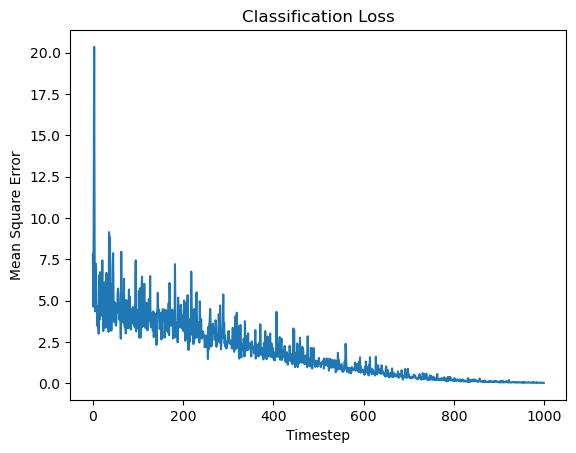

In [10]:
plt.plot(loss_graph)
plt.xlabel("Timestep")
plt.ylabel("Mean Square Error")
plt.title("Classification Loss")

# Figure 15 Functional Equivalent

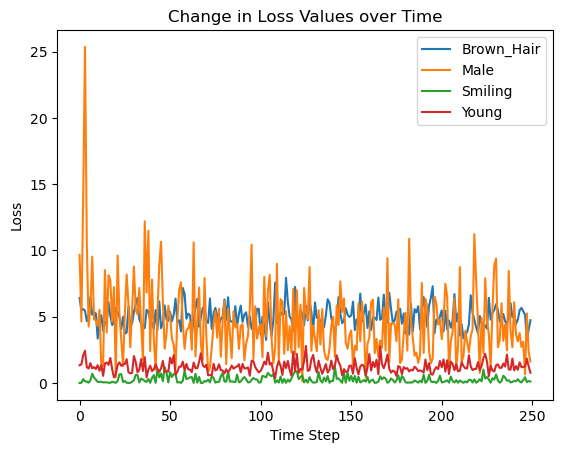

In [8]:
# Transpose the data to have the shape [40, 252]
data = [np.squeeze(arr) for arr in loss_graph_weightless]
data_transposed = np.transpose(data)

# Create a figure and axis object
fig, ax = plt.subplots()

# Iterate through each feature
for i, loss_values in enumerate(data_transposed):
    if (loss_values[0] != 0):
        ax.plot(loss_values[0:250], label=face_attributes[i])

# Set the x-axis and y-axis labels
ax.set_xlabel('Time Step')
ax.set_ylabel('Loss')

# Set the title of the plot
ax.set_title('Change in Loss Values over Time')

ax.legend()

# Display the plot
plt.show()

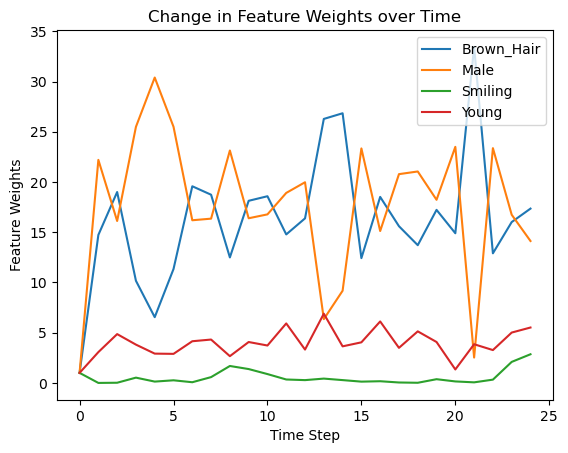

In [12]:
# Transpose the data to have the shape [40, 252]
data = [tensor.squeeze().tolist() for tensor in feature_weights_graph]
data_transposed = list(zip(*data))

# Create a figure and axis object
fig, ax = plt.subplots()

# Iterate through each feature
for i, feature_values in enumerate(data_transposed):
    if (feature_values[0] != 0):
        ax.plot(feature_values[0:25], label=face_attributes[i])

# ax.plot(np.mean(data_transposed, axis=0)[0:25], label='Mean')

# Set the x-axis and y-axis labels
ax.set_xlabel('Time Step')
ax.set_ylabel('Feature Weights')

# Set the title of the plot
ax.set_title('Change in Feature Weights over Time')

ax.legend()

# Display the plot
plt.show()